In [42]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tifffile as tif
from PIL import Image
from skimage.transform import resize

import sys; sys.path.append('..')
from planet.utils.data_utils import random_transforms, tagstr_to_binary, TAGS


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
jpgs_img_dir = '../data/train-jpg'
jpgs_img_ext = 'jpg'
tifs_img_dir = '../data/train-tif-v2'
tifs_img_ext = 'tif'

In [5]:
df = pd.read_csv('../data/train_v2.csv')
img_names = df['image_name'].values
img_tags = np.asarray([tagstr_to_binary(t) for t in df['tags'].values])
print(img_tags)
print(img_tags.shape)

[[0 0 0 ..., 0 0 0]
 [1 0 0 ..., 0 0 1]
 [0 0 0 ..., 0 0 0]
 ..., 
 [1 0 0 ..., 0 0 0]
 [1 0 0 ..., 0 0 0]
 [1 0 0 ..., 0 0 0]]
(40479, 17)


In [6]:
# Mapping from tag to image indexes.
tags_to_img_idxs = [[] for _ in TAGS]
for img_idx, tags in enumerate(img_tags):
    pos_tags, = np.where(tags == 1.)
    for t in pos_tags:
        tags_to_img_idxs[t].append(img_idx)
print(tags_to_img_idxs[0][:10])

[1, 4, 6, 8, 9, 10, 19, 20, 23, 27]


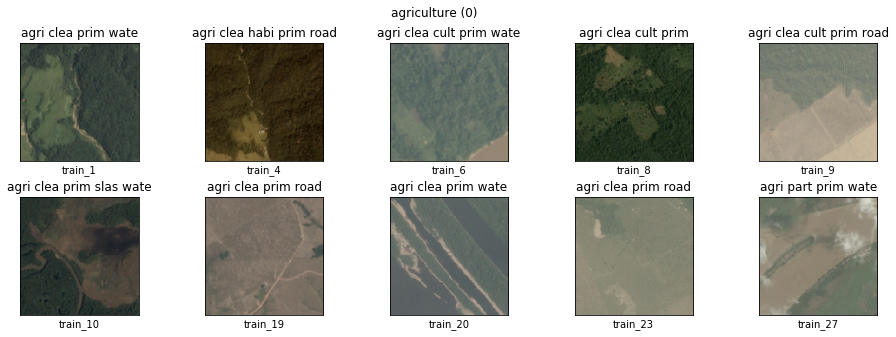

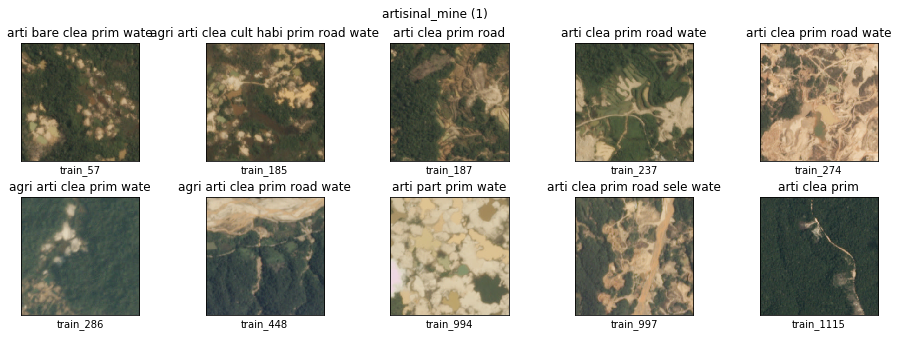

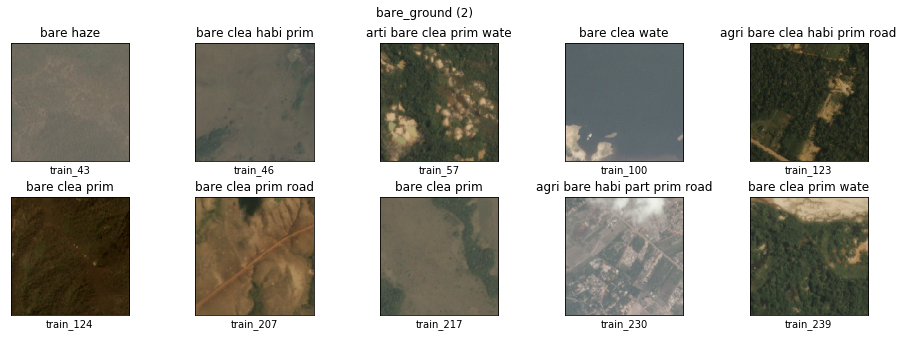

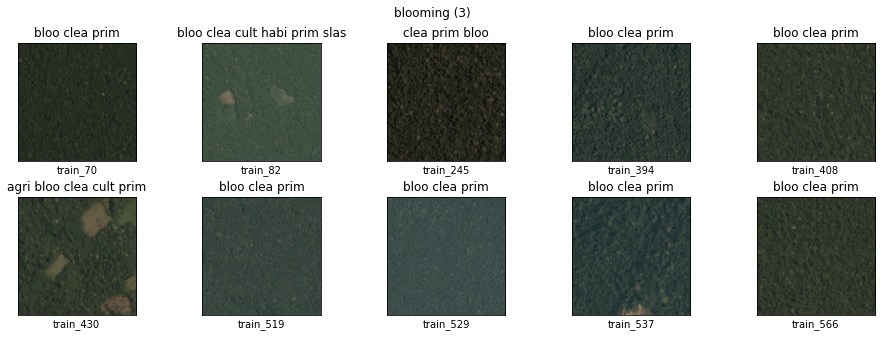

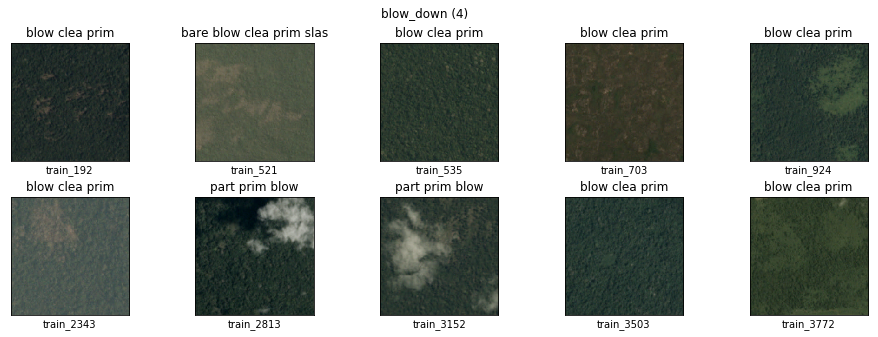

...

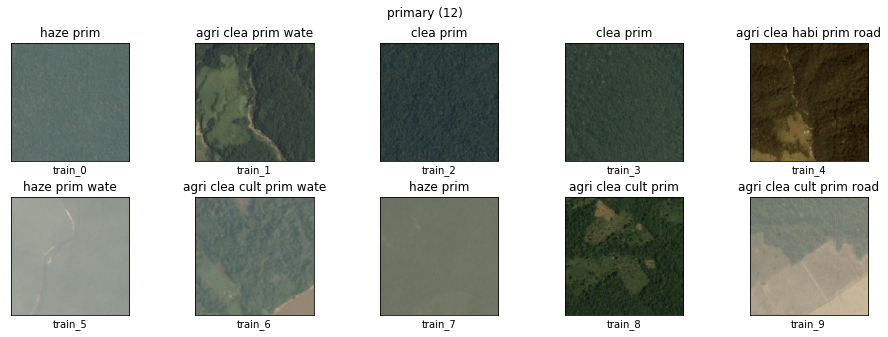

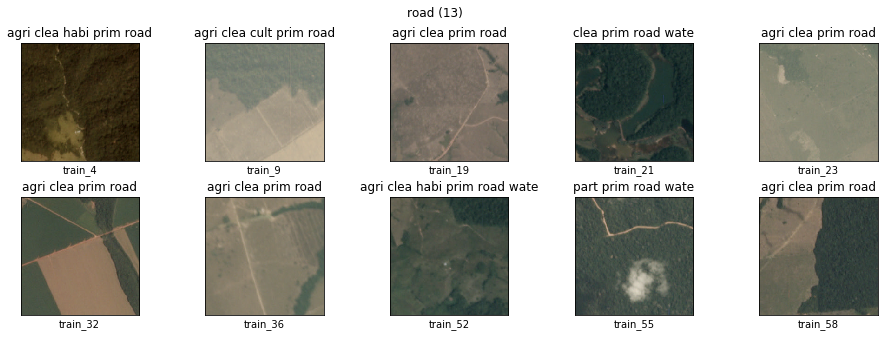

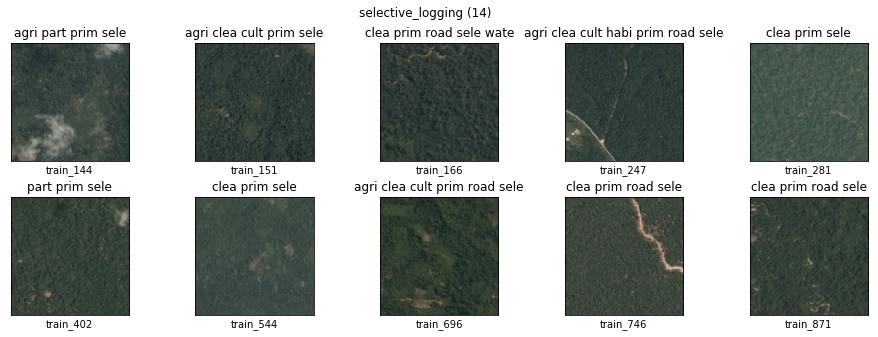

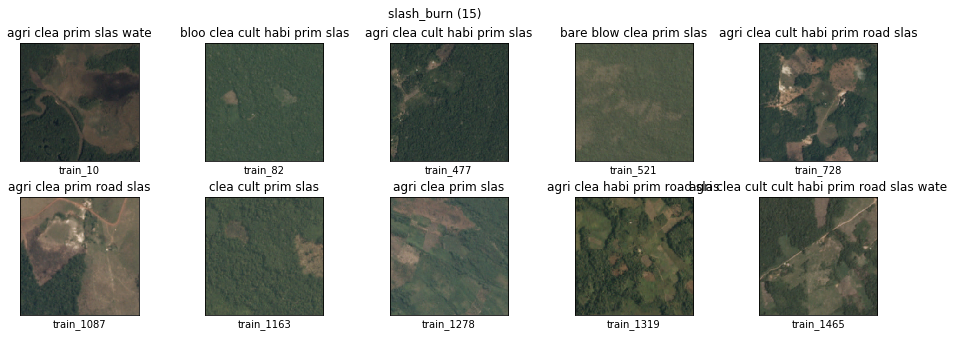

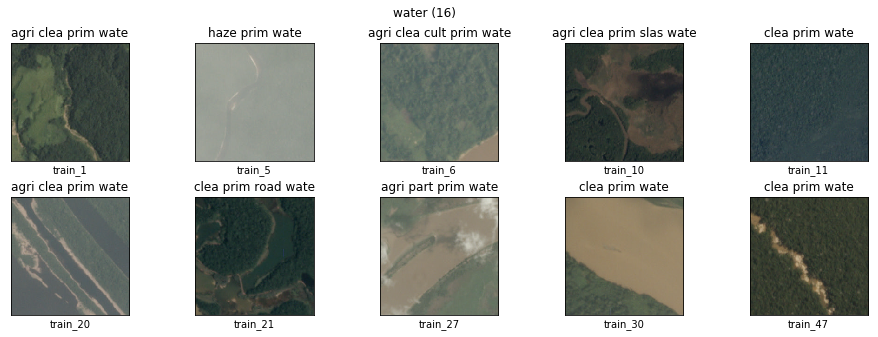

In [7]:
# Show images of each tag
num_imgs_per_tag = 10
num_columns = 5

num_rows = int(num_imgs_per_tag/num_columns)

for tag_idx in range(len(TAGS)):
    fig, _ = plt.subplots(num_rows, num_columns, figsize=(16, num_rows * 2.5))
    fig.suptitle('%s (%d)' % (TAGS[tag_idx], tag_idx))
    for i, img_idx in enumerate(tags_to_img_idxs[tag_idx][:num_imgs_per_tag]):
        img_name = img_names[img_idx]
        img_path = '%s/%s.%s' % (jpgs_img_dir, img_name, jpgs_img_ext)
        img = Image.open(img_path).convert('RGB')
        
        # img.thumbnail((64, 64))
        # img = np.asarray(img) / 255.
        
        ax1 = fig.axes[i]
        ax1.imshow(img)
        
        ax1.set_title(' '.join([t[:4] for t in df['tags'][img_idx].split(' ')]), rotation=0)
        ax1.set_xlabel(img_name)
        ax1.get_xaxis().set_ticks([])
        ax1.get_yaxis().set_ticks([])
    fig.subplots_adjust(hspace=0.3)
    plt.show()
    plt.close()

5 4


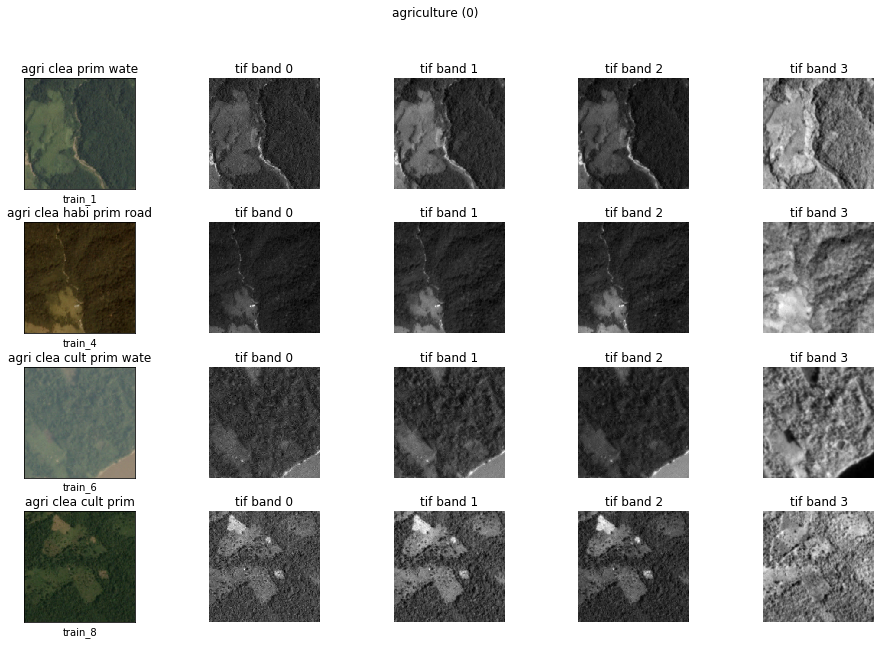

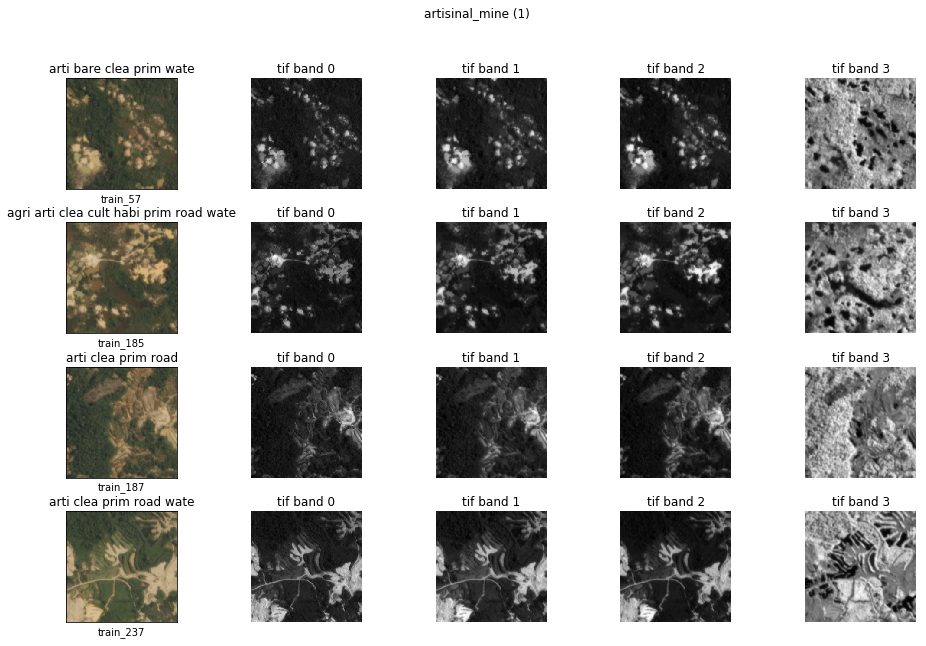

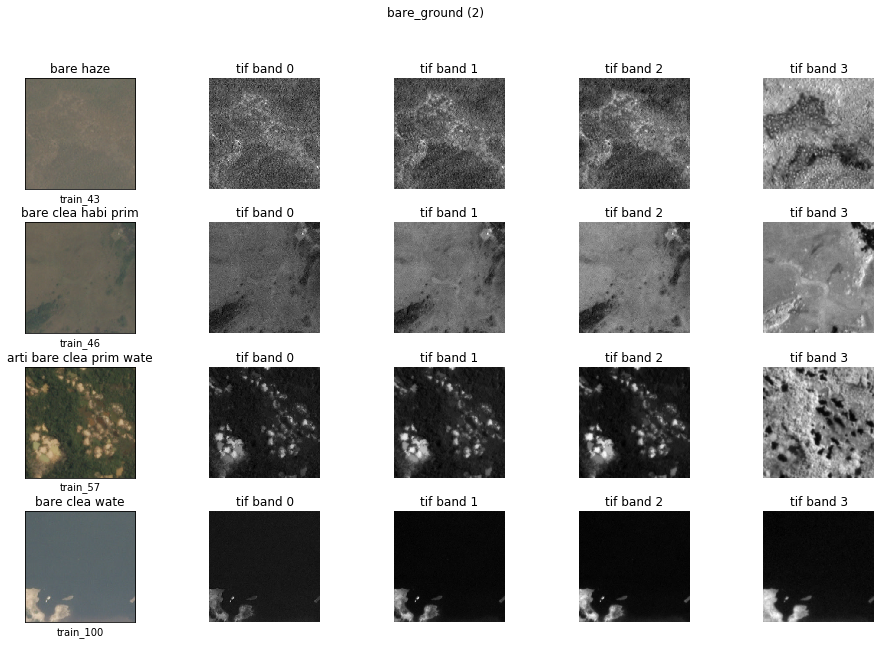

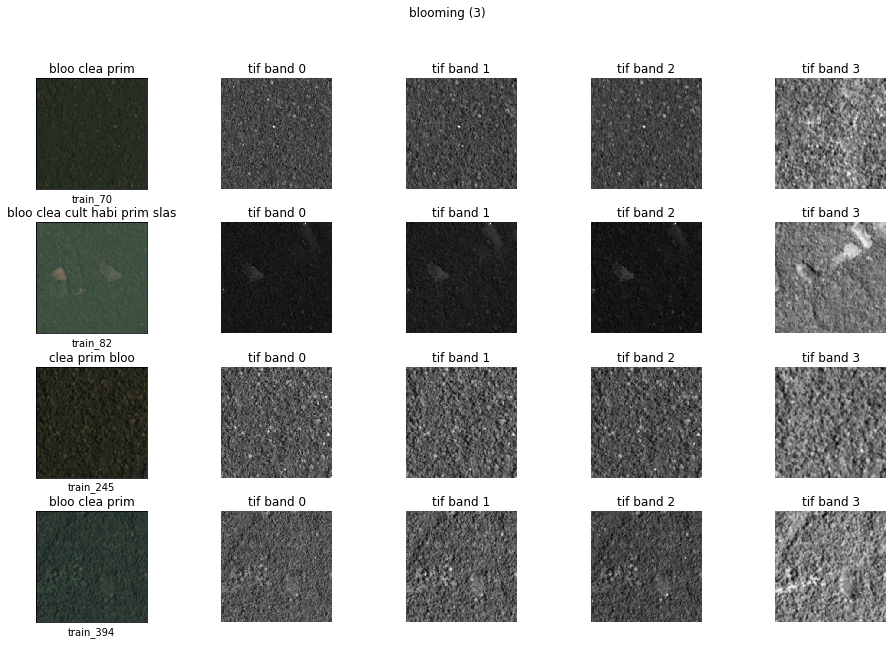

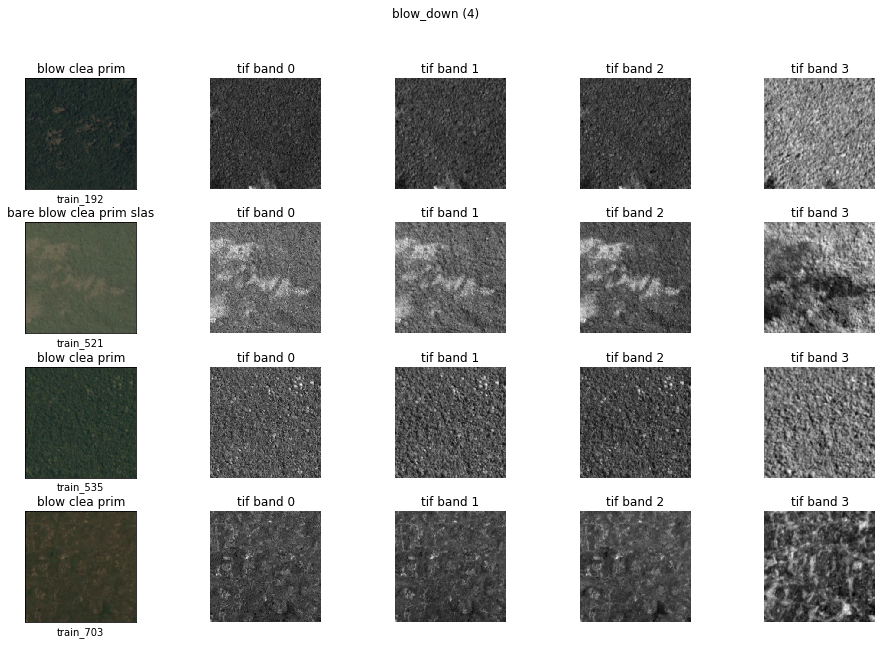

...

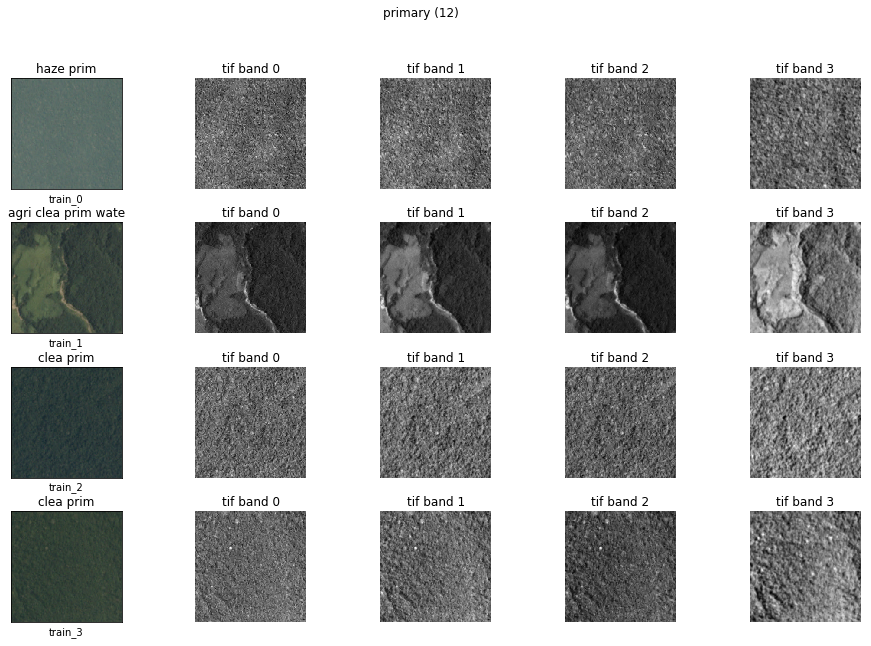

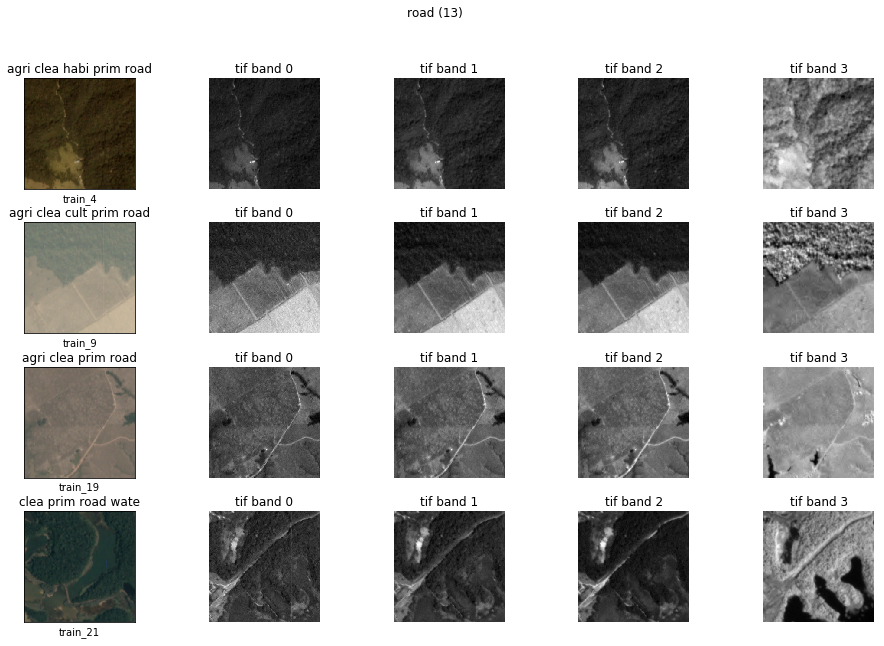

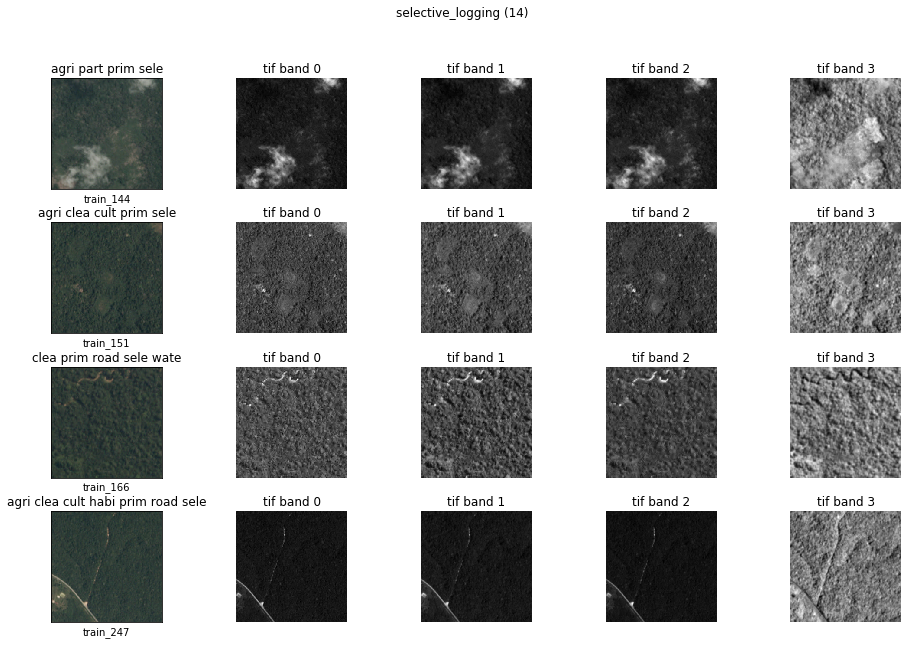

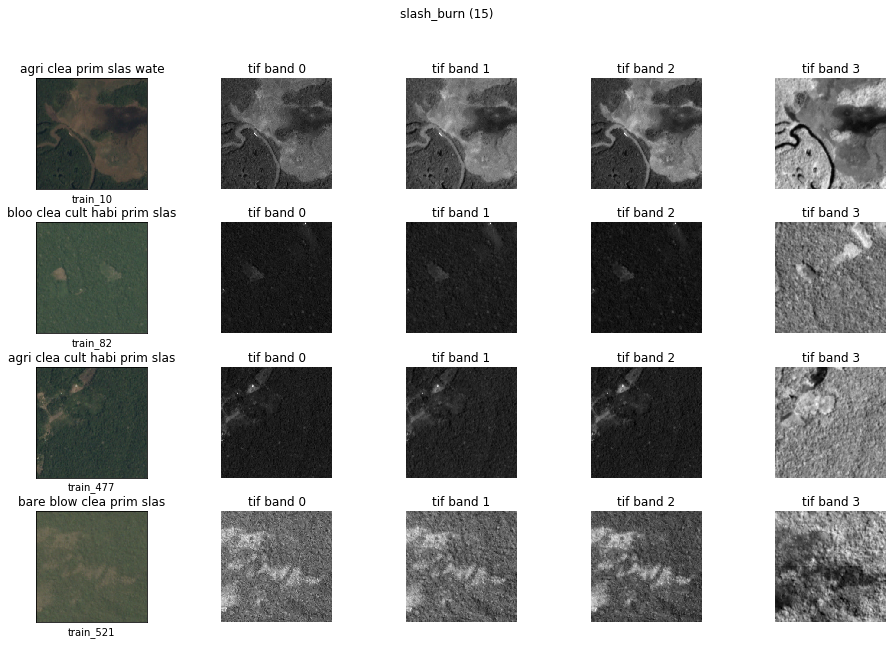

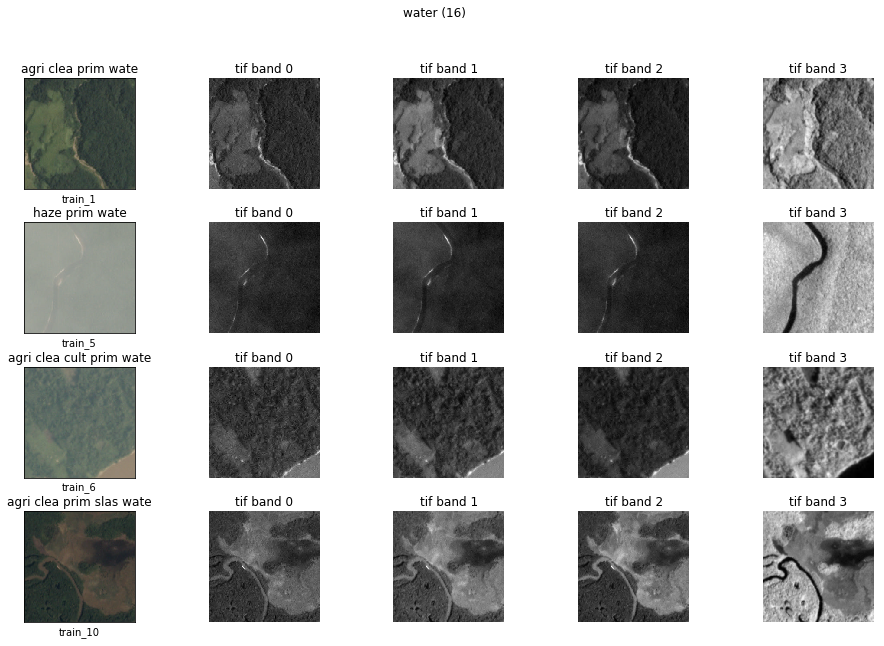

In [45]:
# Show jpg and tiff bands of each tag
num_imgs_per_tag = 4

_num_imgs_per_jpg = 5
num_rows = num_imgs_per_tag

print(num_columns, num_rows)
for tag_idx in range(len(TAGS)):
    fig, _ = plt.subplots(num_rows, _num_imgs_per_jpg, figsize=(16, num_rows * 2.5))
    fig.suptitle('%s (%d)' % (TAGS[tag_idx], tag_idx))
    for i, img_idx in enumerate(tags_to_img_idxs[tag_idx][:num_imgs_per_tag]):
        img_name = img_names[img_idx]
        jpg_img_path = '%s/%s.%s' % (jpgs_img_dir, img_name, jpgs_img_ext)
        jpg_img = Image.open(jpg_img_path).convert('RGB')
        
        fig_idx = _num_imgs_per_jpg*i
        ax = fig.axes[fig_idx]
        ax.imshow(jpg_img)
        
        ax.set_title(' '.join([t[:4] for t in df['tags'][img_idx].split(' ')]), rotation=0)
        ax.set_xlabel(img_name)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        
        tif_img_path = '%s/%s.%s' % (tifs_img_dir, img_name, tifs_img_ext)
#         tif_img = resize(tif.imread(tif_img_path), (64,64), preserve_range=True, mode='constant')
        tif_img = tif.imread(tif_img_path)
        
        for band in range(4):
            ax = fig.axes[fig_idx+1+band]
            ax.axis('off')
            ax.set_title('tif band %d' % band)
            ax.imshow(tif_img[:,:, band], cmap='gray')
            
    fig.subplots_adjust(hspace=0.3)
    plt.show()
    plt.close()
